# **Import Library**

In [ ]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
#import tensorflow_hub as hub
from tensorflow import keras

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [ ]:
print(tf.__version__)
#print(hub.__version__)

2.14.0


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt


## Set Path untuk Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Set Train Path Only


In [ ]:
TPATH = '/content/drive/MyDrive/CNN_Scabies_Detection/dataset/'

In [ ]:
ls $TPATH

melanoma/  nevus/  scabies/


## Resize gambar yang akan digunakan sebagai dataset  
Dalam hal ini kita menggunakan ukuran 224 x 224

In [ ]:
IMAGE_SHAPE = (224, 224)
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255)
image_data = image_generator.flow_from_directory(TPATH, target_size=IMAGE_SHAPE)

Found 1200 images belonging to 3 classes.


In [ ]:
for image_batch, label_batch in image_data:
  print("Image batch shape: ", image_batch.shape)
  print("Label batch shape: ", label_batch.shape)
  break

Image batch shape:  (32, 224, 224, 3)
Label batch shape:  (32, 3)


**ImageDataGenerator **

fungsi ImageDataGenerator adalah untuk mengkonversi gambar ke dalam format array


In [ ]:
display(image_batch[:2])
display(label_batch[:2])

array([[[[0.00392157, 0.00392157, 0.        ],
         [0.6666667 , 0.6666667 , 0.627451  ],
         [0.7176471 , 0.7254902 , 0.68235296],
         ...,
         [0.8470589 , 0.8352942 , 0.86274517],
         [0.8352942 , 0.81568635, 0.8431373 ],
         [0.8941177 , 0.8745099 , 0.90196085]],

        [[0.33333334, 0.32156864, 0.28627452],
         [0.7254902 , 0.7254902 , 0.6862745 ],
         [0.6784314 , 0.6784314 , 0.6392157 ],
         ...,
         [0.854902  , 0.8431373 , 0.8705883 ],
         [0.8313726 , 0.8117648 , 0.83921576],
         [0.8470589 , 0.82745105, 0.854902  ]],

        [[0.69803923, 0.68235296, 0.6392157 ],
         [0.7019608 , 0.69411767, 0.64705884],
         [0.7411765 , 0.73333335, 0.6862745 ],
         ...,
         [0.8078432 , 0.80392164, 0.8352942 ],
         [0.80392164, 0.79215693, 0.82745105],
         [0.8352942 , 0.8235295 , 0.8588236 ]],

        ...,

        [[0.909804  , 0.8705883 , 0.90196085],
         [0.9176471 , 0.87843144, 0.909804  ]

array([[1., 0., 0.],
       [0., 1., 0.]], dtype=float32)

In [ ]:
print(label_batch[0:5])


[[1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [0. 1. 0.]]


Model yang kita buat berikut bersifat sequential atau berurutan , dengan input array 224x224x3 ,menggunakan CNN dengan arsitektur AlexNet sebagai middle layer dan single output

# CNN ALEXNET MODEL

In [ ]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense


num_classes = 3  # Change this to the number of classes you have


model=keras.models.Sequential([
    keras.layers.Conv2D(filters=128, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(224,224,3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3)),
    keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=256, kernel_size=(1,1), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=256, kernel_size=(1,1), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(1024,activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(1024,activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(num_classes,activation='softmax')


])


model.compile(optimizer='adam',
                  loss='categorical_crossentropy',  # Use 'categorical_crossentropy' for multi-class
                  metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 54, 54, 128)       46592     
                                                                 
 batch_normalization (Batch  (None, 54, 54, 128)       512       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 27, 27, 128)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 27, 27, 256)       819456    
                                                                 
 batch_normalization_1 (Bat  (None, 27, 27, 256)       1024      
 chNormalization)                                                
                                                        

In [ ]:
predictions = model(image_batch)
predictions.shape

TensorShape([32, 3])

In [ ]:
class CollectBatchStats(tf.keras.callbacks.Callback):
  def __init__(self):
    self.batch_losses = []
    self.batch_acc = []

  def on_train_batch_end(self, batch, logs=None):
    self.batch_losses.append(logs['loss'])
    self.batch_acc.append(logs['accuracy'])
    self.model.reset_metrics()

# **Training Model**  
Pada model CNN yang digunakan menggunakan iterasi (epoch) sebanyak 10 kali

In [ ]:
steps_per_epoch = np.ceil(image_data.samples/image_data.batch_size)

batch_stats_callback = CollectBatchStats()

history = model.fit(image_data, epochs=10,
                              steps_per_epoch=steps_per_epoch,
                              callbacks = [batch_stats_callback])

Epoch 1/10
38/38 [==============================] - 22s 535ms/step - loss: 0.0000e+00 - accuracy: 0.0000e+00
Epoch 2/10
38/38 [==============================] - 21s 539ms/step - loss: 0.0000e+00 - accuracy: 0.0000e+00
Epoch 3/10
38/38 [==============================] - 20s 530ms/step - loss: 0.0000e+00 - accuracy: 0.0000e+00
Epoch 4/10
38/38 [==============================] - 20s 534ms/step - loss: 0.0000e+00 - accuracy: 0.0000e+00
Epoch 5/10
38/38 [==============================] - 21s 544ms/step - loss: 0.0000e+00 - accuracy: 0.0000e+00
Epoch 6/10
38/38 [==============================] - 21s 539ms/step - loss: 0.0000e+00 - accuracy: 0.0000e+00
Epoch 7/10
38/38 [==============================] - 21s 545ms/step - loss: 0.0000e+00 - accuracy: 0.0000e+00
Epoch 8/10
38/38 [==============================] - 22s 580ms/step - loss: 0.0000e+00 - accuracy: 0.0000e+00
Epoch 9/10
38/38 [==============================] - 20s 532ms/step - loss: 0.0000e+00 - accuracy: 0.0000e+00
Epoch 10/10
38/38 [

# **Plotting Learning Curve**  
Learning Curve dibawah ini merupakan visaulisasi iterasi pembelajaran pada proses diatas

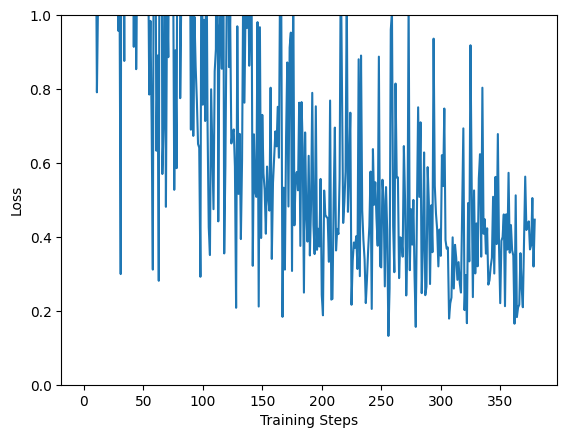

In [ ]:
plt.figure()
plt.ylabel("Loss")
plt.xlabel("Training Steps")
plt.ylim([0,1])
plt.plot(batch_stats_callback.batch_losses)

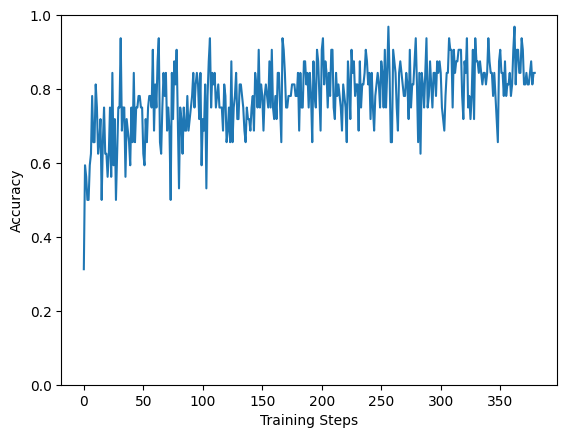

In [ ]:
plt.figure()
plt.ylabel("Accuracy")
plt.xlabel("Training Steps")
plt.ylim([0,1])
plt.plot(batch_stats_callback.batch_acc)

In [ ]:
class_names = sorted(image_data.class_indices.items(), key=lambda pair:pair[1])
class_names = np.array([key.title() for key, value in class_names])
class_names

array(['Melanoma', 'Nevus', 'Scabies'], dtype='<U8')

In [ ]:
class_names[0]='Melanoma'
class_names[1]='Nevus'
class_names[2]='Scabies'

print(class_names)

['Melanoma' 'Nevus' 'Scabies']


In [ ]:
predicted_batch = model.predict(image_batch)
predicted_id = np.argmax(predicted_batch, axis=-1)
predicted_label_batch = class_names[predicted_id]

1/1 [==============================] - 1s 633ms/step


In [ ]:
label_id = np.argmax(label_batch, axis=-1)


# Prediction Hasil Training

Bagian ini mencoba menerka Jenis Penyakit Kulit, sebagai catatan predikti adalah 20% dari total data sedangkan pembelajaran menggunakan 80% data total

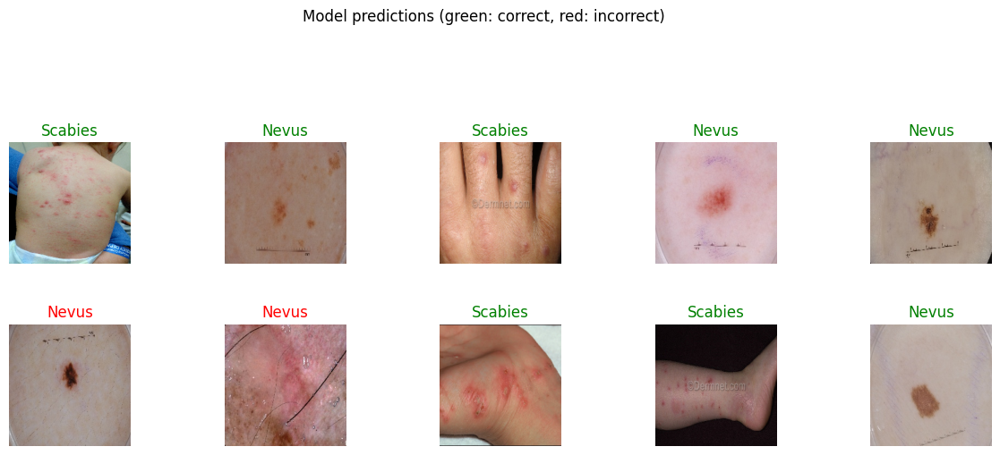

In [ ]:
plt.figure(figsize=(15,15))
plt.subplots_adjust(hspace=0.5)
for n in range(10):
  plt.subplot(6,5,n+1)
  plt.imshow(image_batch[n])
  color = "green" if predicted_id[n] == label_id[n] else "red"
  plt.title(predicted_label_batch[n].title(), color=color)
  plt.axis('off')
_ = plt.suptitle("Model predictions (green: correct, red: incorrect)")

# Menyimpan Model yang telah di training untuk memudahkan saat akan mengimplementasikan program

In [ ]:
#model.save('CNN_DATASET_MODEL5.h5')

# **RECALL THE MODEL FOR PREDICTION**

# **LOAD MODEL**

In [ ]:
from keras.models import load_model
from PIL import Image, ImageOps
import numpy as np
import matplotlib.pyplot as plt

# Disable scientific notation for clarity
np.set_printoptions(suppress=True)

# Load the model
model = load_model("/content/drive/MyDrive/CNN_Scabies_Detection/H5/cnn_alexnet_model.h5", compile=False)

# Load the labels
class_names = open("/content/drive/MyDrive/CNN_Scabies_Detection/H5/labels.txt", "r").readlines()

# Define a function for image classification
def classify_image(image_path):
    # Create the array of the right shape to feed into the keras model
    data = np.ndarray(shape=(1, 224, 224, 3), dtype=np.float32)

    # Load the image from the provided path
    image = Image.open(image_path).convert("RGB")

    # resizing the image to be at least 224x224 and then cropping from the center
    size = (224, 224)
    image = ImageOps.fit(image, size, Image.Resampling.LANCZOS)

    # Turn the image into a numpy array
    image_array = np.asarray(image)

    # Normalize the image
    normalized_image_array = (image_array.astype(np.float32) / 127.5) - 1

    # Load the image into the array
    data[0] = normalized_image_array

    # Predicts the model
    prediction = model.predict(data)
    index = np.argmax(prediction)
    class_name = class_names[index]
    confidence_score = prediction[0][index]

    return class_name[2:], confidence_score


#**Prediksi Gambar Menggunakan Inputan**


**Prediksi Gambar Scabies**

1/1 [==============================] - 0s 38ms/step


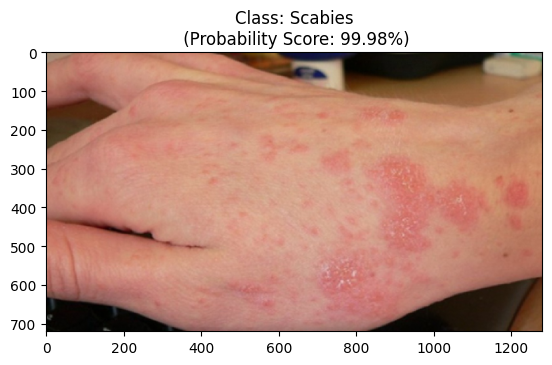

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies1.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 22ms/step


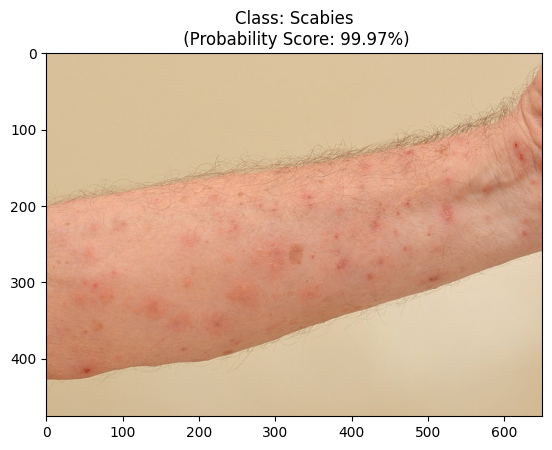

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies2.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 26ms/step


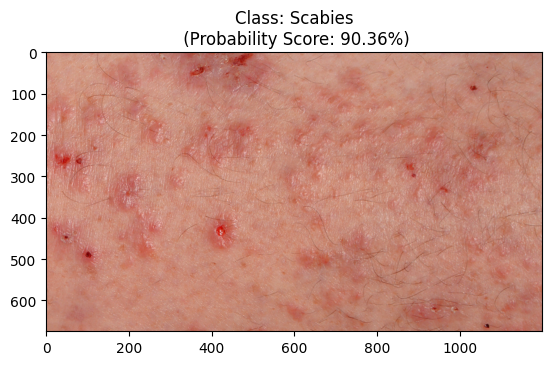

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies3.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 22ms/step


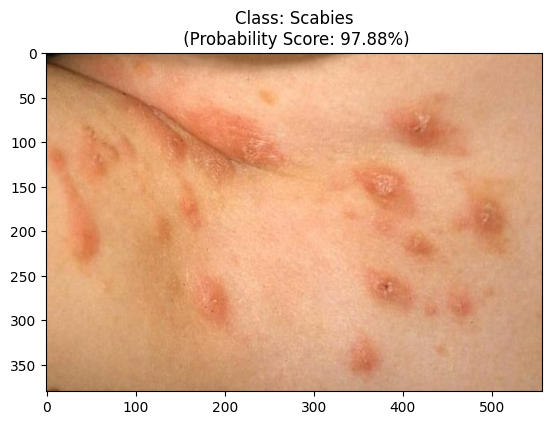

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies4.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 40ms/step


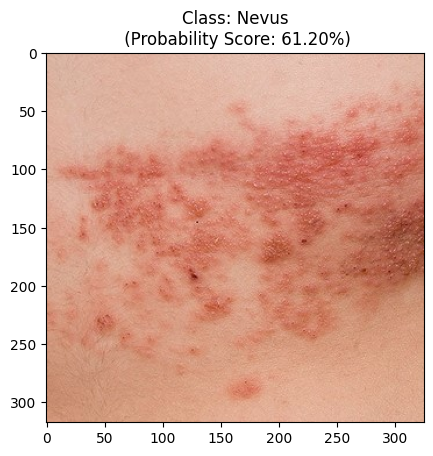

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies5.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 21ms/step


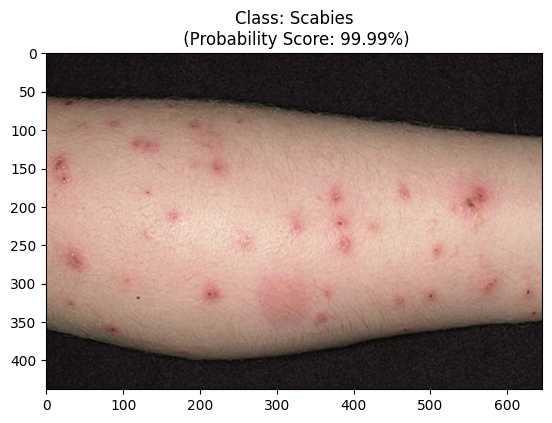

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies6.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 32ms/step


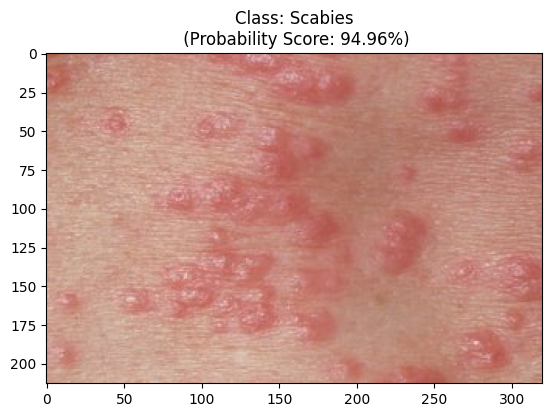

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies7.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 37ms/step


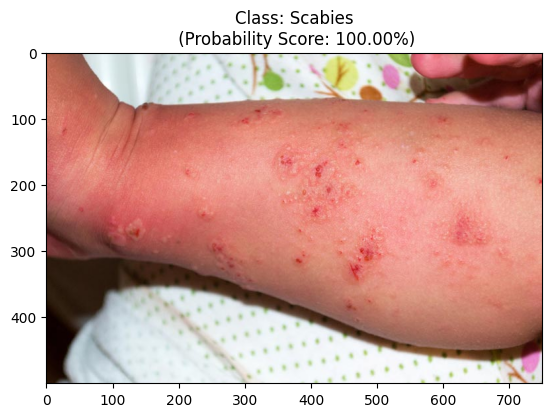

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies8.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 22ms/step


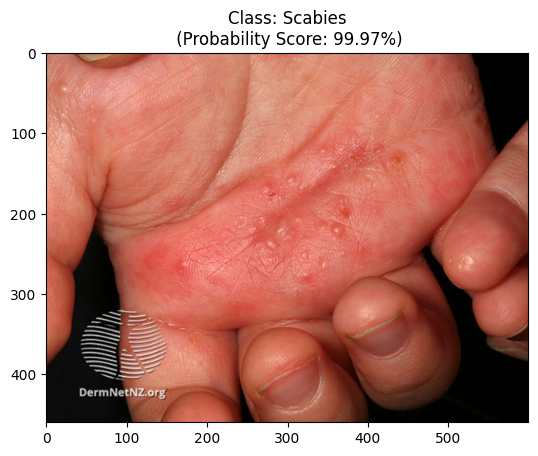

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies9.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 34ms/step


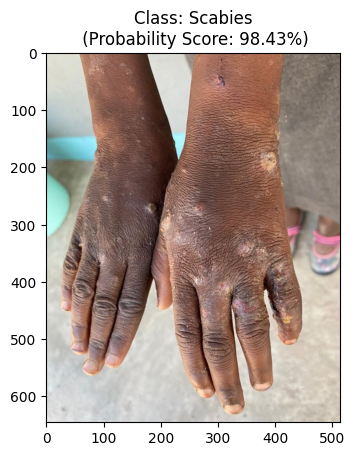

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies10.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 41ms/step


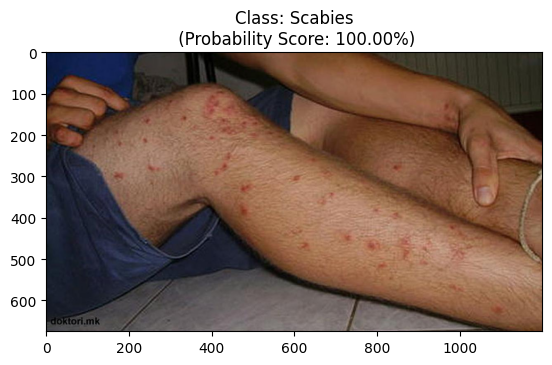

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies11.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 23ms/step


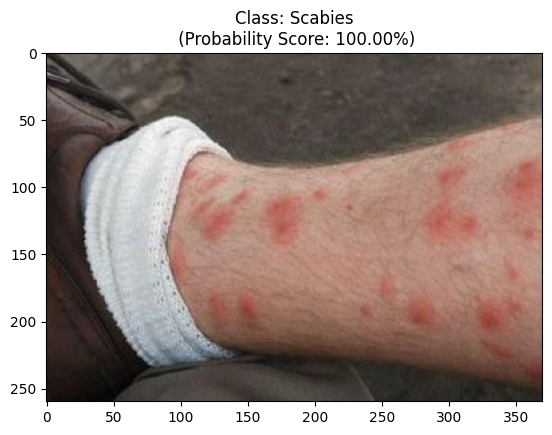

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies12.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 21ms/step


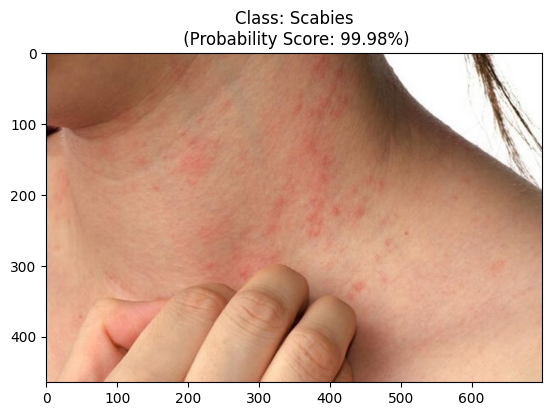

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies13.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 50ms/step


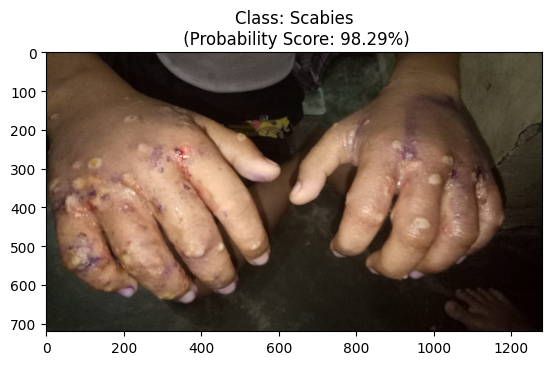

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies14.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 35ms/step


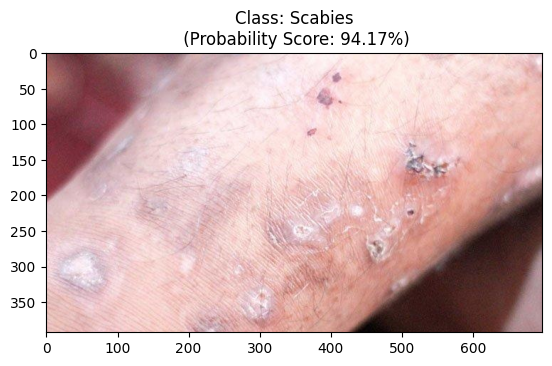

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/scabies15.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

**Prediksi Gambar Melanoma**

1/1 [==============================] - 0s 33ms/step


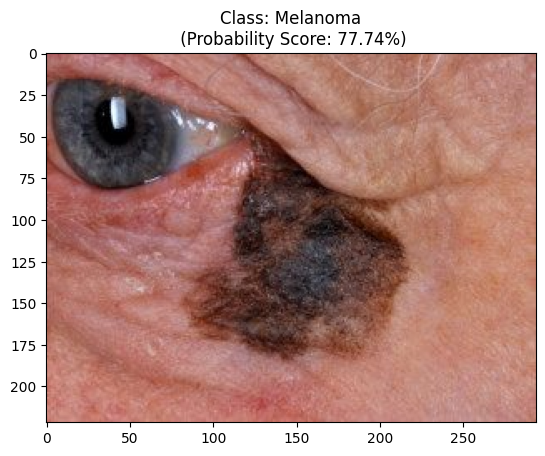

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/melanoma1.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 23ms/step


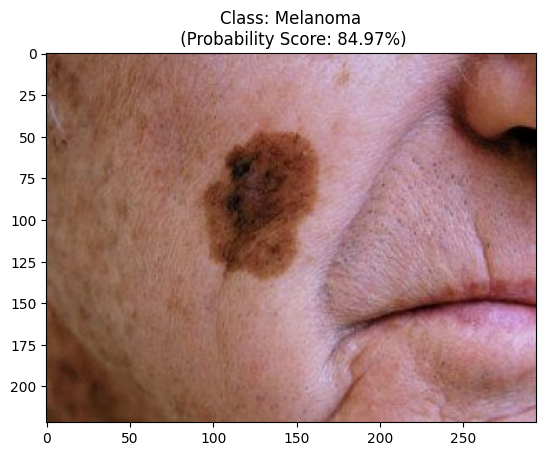

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/melanoma2.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 43ms/step


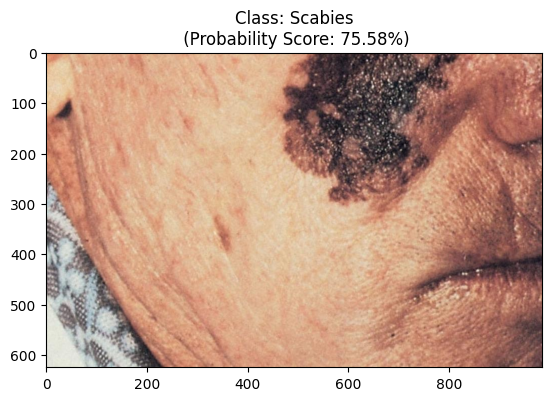

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/melanoma3.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 24ms/step


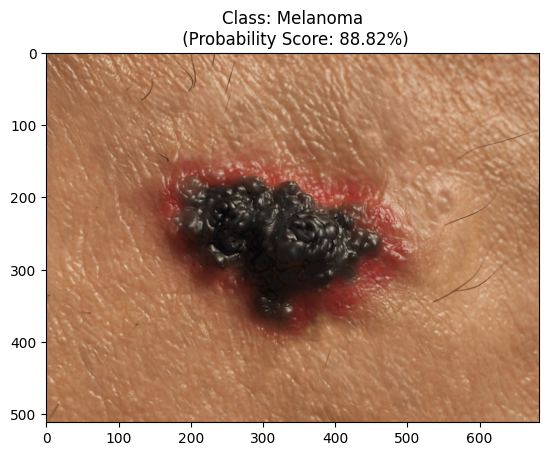

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/melanoma4.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 73ms/step


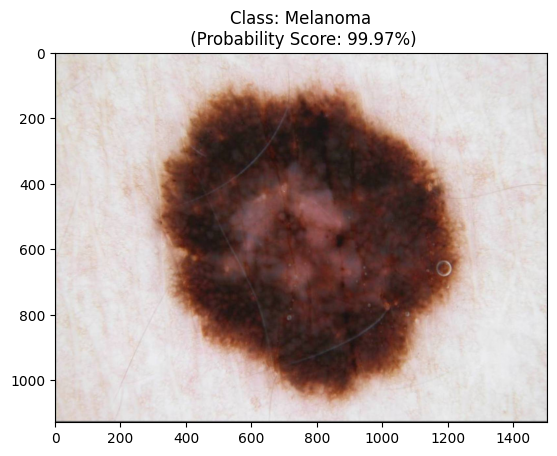

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/melanoma5.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 21ms/step


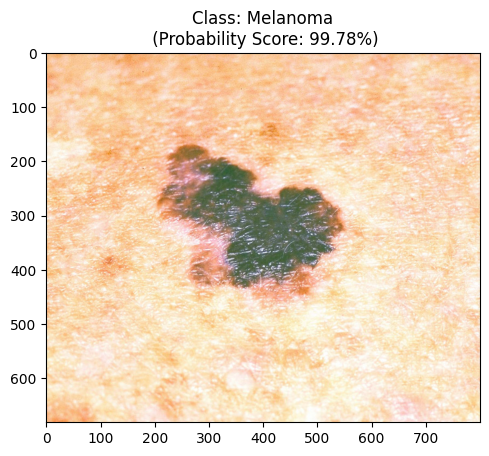

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/melanoma6.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 24ms/step


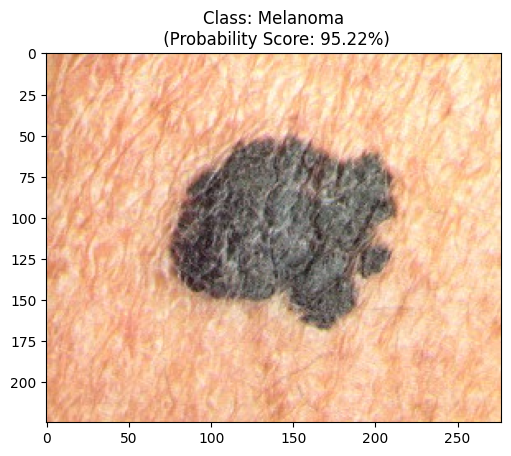

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/melanoma7.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 24ms/step


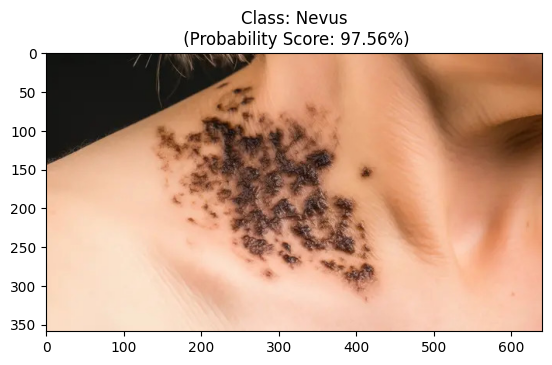

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/nevus1.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 22ms/step


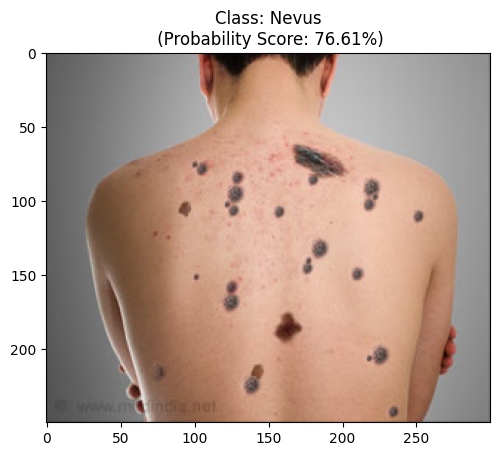

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/nevus2.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 22ms/step


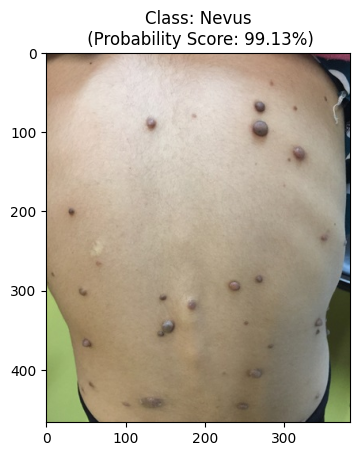

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/nevus3.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 23ms/step


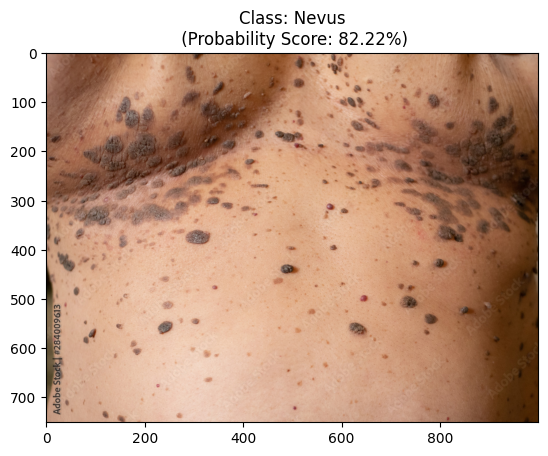

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/nevus4.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 34ms/step


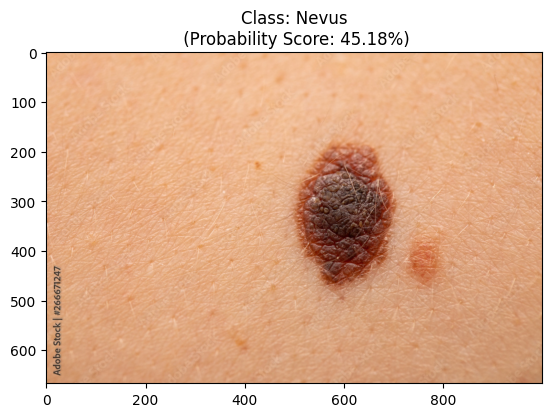

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/nevus5.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 22ms/step


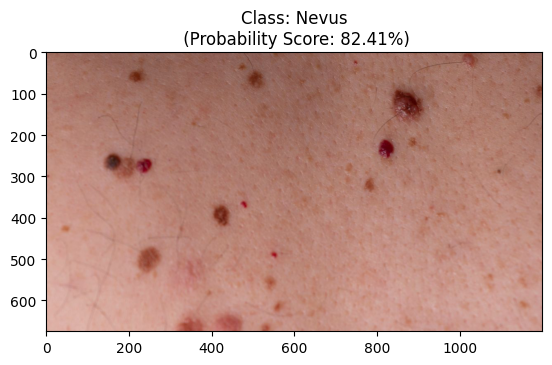

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/nevus6.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 21ms/step


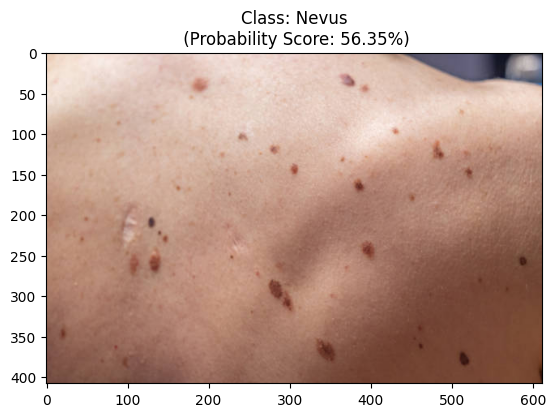

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/nevus7.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

1/1 [==============================] - 0s 21ms/step


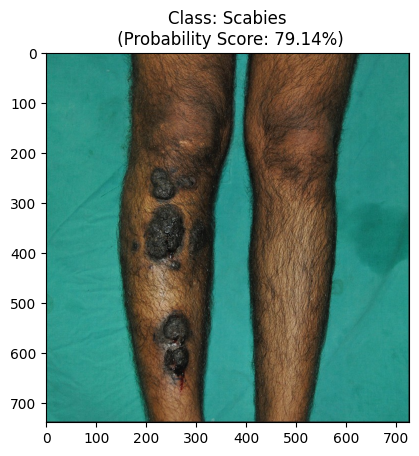

In [ ]:
# Example usage of the function
image_path = "/content/drive/MyDrive/CNN_Scabies_Detection/data_testing/nevus8.jpg" # Replace with the path to your image
class_name, confidence_score = classify_image(image_path)

# Display the image and prediction
plt.imshow(Image.open(image_path).convert("RGB"))
plt.title("Class: {} (Probability Score: {:.2%})".format(class_name, confidence_score))
plt.show()

**Prediksi Gambar Nevus**

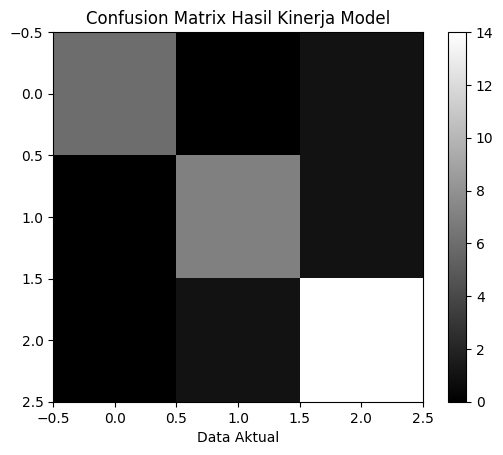

In [ ]:
import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

#data_act = [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
#data_pred = [1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1]

data_act = [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
data_pred = [2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2]

cm = confusion_matrix (data_act, data_pred)

plt.imshow(cm, cmap=plt.cm.gray)
plt.title("Confusion Matrix Hasil Kinerja Model")
plt.colorbar()
plt.xlabel('Data Prediksi')
plt.xlabel('Data Aktual')
plt.show()

In [ ]:
print(classification_report(data_pred, data_act))

              precision    recall  f1-score   support

           0       0.86      1.00      0.92         6
           1       0.88      0.88      0.88         8
           2       0.93      0.88      0.90        16

    accuracy                           0.90        30
   macro avg       0.89      0.92      0.90        30
weighted avg       0.90      0.90      0.90        30

